QUESTION-1

1.

Storage of image = 5.76 MB i.e., 5760000 bytes.  
Since image is colored, each pixel is of 3 bytes.  
Total no.of pixels = (5760000)/3 = 1920000 Pixels  
Aspect ratio = 4:3  
Let number of rows = 4x  
number of columns = 3x  
Total pixels = 12(x^2) = 1920000  
On solving x = 400  
Height = 400*4 = 1600  
Width = 400*3 = 1200   

2.  
Pixels in a row and column = 5200
Total Pixels = 5200*5200 = 27040000  
(a)Black and white:  
Each Pixel is of 1 bit  
Total no.of bits = 27040000
Bytes = 3380000  
Total number of images = 2000
Total bytes = 6760000000
Each memory card size = 64GB = 64000000000 bytes  
Total no.of memory cards = ceil(6760000000/64000000000) = 1 memory card

(b)Gray Scale Images  
Each Pixel is of 1 byte  
Total no.of bytes of all images = 5200*5200*2000 = 54080000000  
Total no.of memory cards = ceil(54080000000/64000000000) = 1 memory card  

(c) Colored images  
Each Pixel is of 3 bytes  
Total no.of bytes of all images = 5200*5200*3*2000 = 162240000000  
Total no.of memory cards = ceil(162240000000/64000000000) = 3 memory cards  

3

Size of pixel in the image is larger when is printed on paper, than when is observed on desktop. That makes to feel the image is pixelated. Here, the resolution is same but the size of the pixel is varied. 

In [275]:
import cv2
import numpy
import math
import time
from matplotlib import pyplot as plt

QUESTION-2

1

In [506]:
def mostfreq(image):
    l,w,c=np.shape(img)
    arr, freq = np.unique(img.reshape(l*w, 3), axis=0, return_counts=True)  
    max=0
    p=0
    pos=0
    for i in freq:
        if (i>max):
            max=i
            pos=p
        p=p+1
    return (arr[pos])



In [509]:
img = cv2.imread("../imgs/Creed.png")
print(mostfreq(img))

[224 224 224]


In [20]:
img = cv2.imread("../imgs/office.jpg",0)
img = img/255
print(img)

[[0.41176471 0.41960784 0.40784314 ... 0.44313725 0.4627451  0.44705882]
 [0.39607843 0.4        0.4        ... 0.45490196 0.45490196 0.43529412]
 [0.4        0.4        0.40392157 ... 0.45882353 0.45098039 0.43529412]
 ...
 [0.36862745 0.37254902 0.4        ... 0.45098039 0.45490196 0.42745098]
 [0.40784314 0.38823529 0.39607843 ... 0.49411765 0.49411765 0.45882353]
 [0.44705882 0.40392157 0.38431373 ... 0.44313725 0.45490196 0.49411765]]


2

897 1277


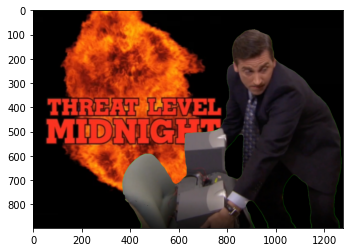

In [470]:
img1 = cv2.imread("../imgs/background.png")
img2 = cv2.imread("../imgs/foreground.png")

h,w = img1.shape[0],img1.shape[1]
h1,w1 = img2.shape[0],img2.shape[1]
img3 = np.empty((h1,w1,3),dtype=int)
#print(h,w)
print(h1,w1)
for i in range(h1):
  for j in range(w1):

    # if (max(img2[i][j][0] , img2[i][j][1] , img2[i][j][2] ) == img2[i][j][1]) and  img2[i][j][1]>= 20:##((img2[i][j][0] + img2[i][j][1] + img2[i][j][2])/3 <= 0.67*img2[i][j][1]) :
    thres = 90
    if img2[i][j][1]>= thres and img2[i][j][0] <=thres and img2[i][j][2] <=thres:
      
      img3[i][j][0] = img1[i][j][2]
      img3[i][j][1] = img1[i][j][1]
      img3[i][j][2] = img1[i][j][0]
    else:
      img3[i][j][0] = img2[i][j][2]
      img3[i][j][1] = img2[i][j][1]
      img3[i][j][2] = img2[i][j][0]

plt.imshow(img3)
plt.show()

QUESTION - 3

1

In [21]:
def piecewiseLinTransform(img,k1,k2,a,b):
  no_linear = len(k1)
  h,w = img.shape[0],img.shape[1]
  img2 = np.empty((h,w),dtype = int)
  for i in range(h):
    for j in range(w):
      pix = (img[i][j] )/(255)

      for k in range(no_linear):
        if a[k] <= pix < b[k]:
          img2[i][j] = (k1[k]*pix + k2[k])*255
          break

  return img2

2

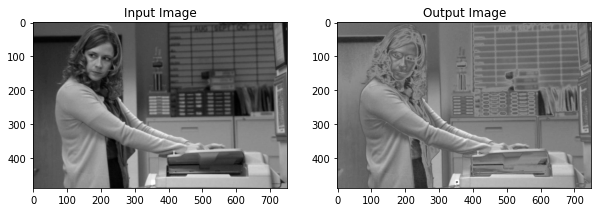

In [69]:
img = cv2.imread("../imgs/pam1.png")
img3 = img[:,:,0]*(1/3) + img[:,:,1]*(1/3) + img[:,:,2]*(1/3)
a = [0 ,0.2, 0.4]
b = [0.2, 0.4, 1]
k1 = [2, -1, 1]
k2 = [0.1, 0.7, -0.1]

img2 = np.empty((img.shape[0],img.shape[1]),dtype = int)
img2 = piecewiseLinTransform(img3,k1,k2,a,b)
#print(img)
#print(img2)
fig = plt.figure(figsize=(10, 7))
rows = 1
columns = 2
fig.add_subplot(rows, columns, 1)
plt.imshow(img3,cmap = 'gray')
plt.title("Input Image")

fig.add_subplot(rows, columns, 2)
plt.imshow(img2,cmap = 'gray')
plt.title("Output Image")
plt.show()

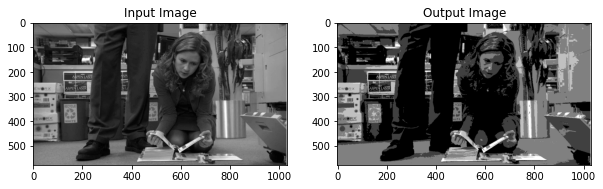

In [70]:
img = cv2.imread("../imgs/pam2.png")
img = img[:,:,1]*(1/3) + img[:,:,1]*(1/3) + img[:,:,2]*(1/3)
a1 = [0,0.2,0.4,0.6,0.8]
b1= [0.2,0.4,0.6,0.8,1]
k11 = [0,0,0,0,0]
k22 = [0,0.2,0.4,0.6,0.8]

img2 = np.empty((img.shape[0],img.shape[1]),dtype = int)
img2 = piecewiseLinTransform(img,k11,k22,a1,b1)
fig = plt.figure(figsize=(10, 7))
fig.add_subplot(1, 2, 1)
plt.imshow(img,cmap = 'gray')
plt.title("Input Image")

fig.add_subplot(1, 2, 2)
plt.imshow(img2,cmap = 'gray')
plt.title("Output Image")
plt.show()

3

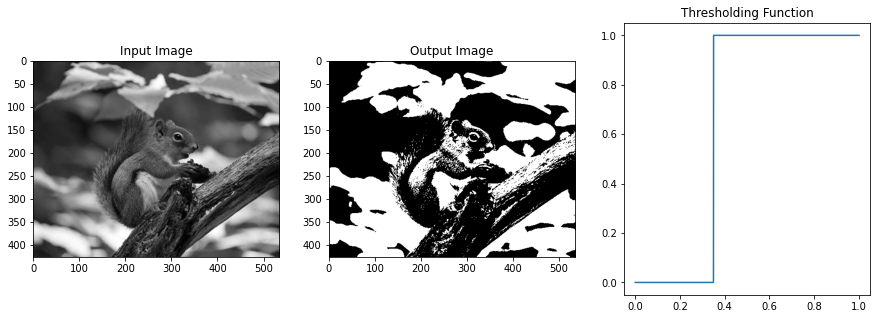

In [71]:
squi = cv2.imread("../imgs/squir.jpg")
squi = squi[:,:,0]*(1/3) + squi[:,:,1]*(1/3) + squi[:,:,2]*(1/3)
a1 = [0,0.35]
b1= [0.35,1]
k11 = [0,0]
k22 = [0,1]

y = []
x= np.linspace(0,1,2000)
for i in x:
    if i<a1[1]:
        y.append(0)
    else:
        y.append(1)

squi_pp = np.empty((squi.shape[0],squi.shape[1]),dtype = int)
squi_pp = piecewiseLinTransform(squi,k11,k22,a1,b1)
fig = plt.figure(figsize=(15, 5))
fig.add_subplot(1, 3, 1)
plt.imshow(squi,cmap = 'gray')
plt.title("Input Image")

fig.add_subplot(1, 3, 2)
plt.imshow(squi_pp,cmap = 'gray')
plt.title("Output Image")

fig.add_subplot(1,3,3)
plt.plot(x,y)
plt.title("Thresholding Function")
plt.show()



As in the plot, input values goes from 0 to 1. But the intensity values lie between 0 and 255. So, all the intensity values are modified to lie between 0 and 1 and then piecewise linear transform is performed and output values are again scaled to (0,255).

QUESTION - 4

1

In [72]:
def  bitSlice(img_4,k):
  himg_4,wimg_4 = img_4.shape
  binary_repr_v = np.vectorize(np.binary_repr)
  bin_conv = binary_repr_v(img_4, 8)
  bitplane = np.empty((himg_4,wimg_4),dtype = int)

  for i in range(himg_4):
    for j in range(wimg_4):
      
      bitplane[i][j] = int(bin_conv[i][j][-k])*(2**(k-1))

  return bitplane

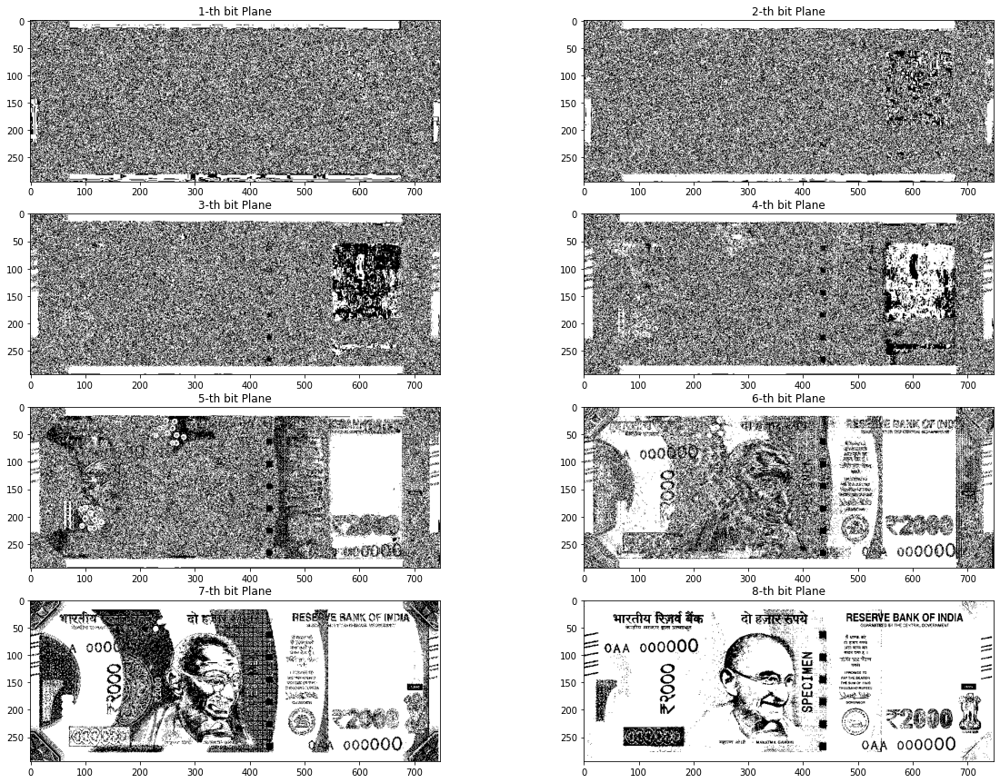

In [74]:
rupee = cv2.imread("../imgs/rupee.jpg")
hrupee,wrupee,channels = rupee.shape
gray_ru = np.empty((hrupee,wrupee),dtype = int)
for i in range(hrupee):
  for j in range(wrupee):
    gray_ru[i][j] = np.sum(rupee[i][j])//3
fig = plt.figure(figsize = (20,15))
rows = 4
columns = 2

for k_plane in range(1,9):
  fig.add_subplot(rows,columns,k_plane)
  ob_plane_rupee = bitSlice(gray_ru,k_plane)
  plt.imshow(ob_plane_rupee,cmap = plt.cm.gray)
  plt.title(str(k_plane)+'-th bit Plane')
plt.show()

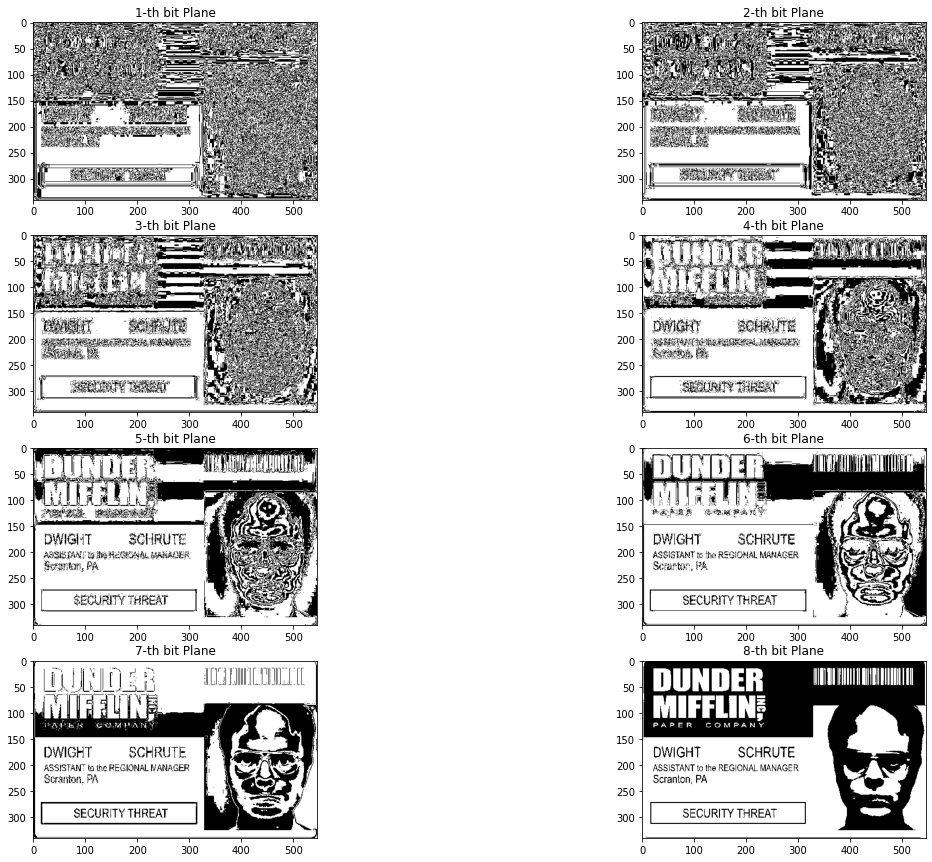

In [75]:
sec_threat = cv2.imread("../imgs/securityThreat.jpg")
hsec_threat,wsec_threat,channels = sec_threat.shape
gray_sec = np.empty((hsec_threat,wsec_threat),dtype = int)
for i in range(hsec_threat):
  for j in range(wsec_threat):
    gray_sec[i][j] = np.sum(sec_threat[i][j])//3
fig = plt.figure(figsize = (20,15))
rows = 4
columns = 2

for k_plane in range(1,9):
  fig.add_subplot(rows,columns,k_plane)
  ob_plane_secu = bitSlice(gray_sec,k_plane)
  plt.imshow(ob_plane_secu,cmap = 'gray')
  plt.title(str(k_plane)+'-th bit Plane')
plt.show()

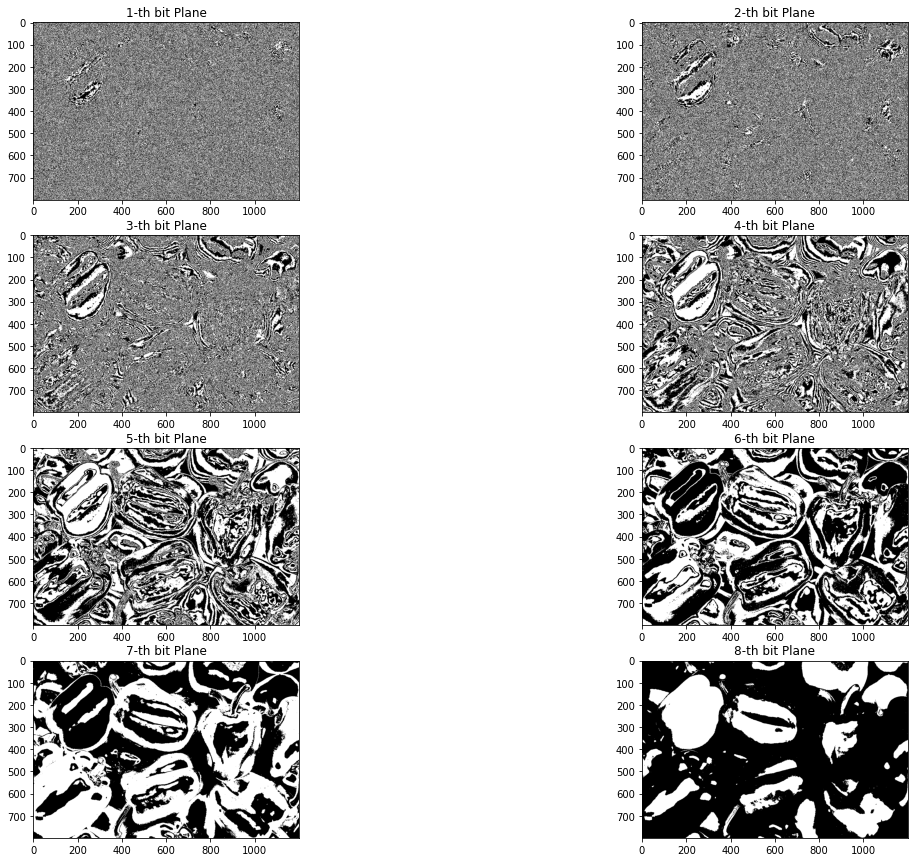

In [76]:
pepper = cv2.imread("../imgs/pepper.jpg")
hpepper,wpepper,channels = pepper.shape
gray_pepper = np.empty((hpepper,wpepper),dtype = int)
for i in range(hpepper):
  for j in range(wpepper):
    gray_pepper[i][j] = np.sum(pepper[i][j])//3
fig = plt.figure(figsize = (20,15))
rows = 4
columns = 2

for k_plane in range(1,9):
  fig.add_subplot(rows,columns,k_plane)
  ob_plane_pepper = bitSlice(gray_pepper,k_plane)
  plt.imshow(ob_plane_pepper,cmap = 'gray')
  plt.title(str(k_plane)+'-th bit Plane')
plt.show()

3

In [77]:
def imgBitQuantizer(image,k):
  himage,wimage = image.shape
  
  quant_image = bitSlice(image,8)
  
  for quant_levels in range(7,7-(k-1),-1):
    plane_image = bitSlice(image,quant_levels)
    quant_image = quant_image + plane_image
  return quant_image

4

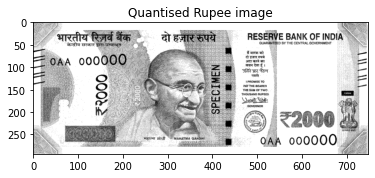

In [78]:
rupee4_4 = cv2.imread("../imgs/rupee.jpg")
hrupee4_4,wrupee4_4,channels4_4 = rupee4_4.shape
gray_ru4_4 = np.empty((hrupee4_4,wrupee4_4),dtype = int)
for i in range(hrupee4_4):
  for j in range(wrupee4_4):
    gray_ru4_4[i][j] = np.sum(rupee4_4[i][j])//3

quant_output1 = imgBitQuantizer(gray_ru4_4,3)            #### Vary the parameter k   here k = 3
plt.imshow(quant_output1,cmap = 'gray')
plt.title("Quantised Rupee image")
plt.show()

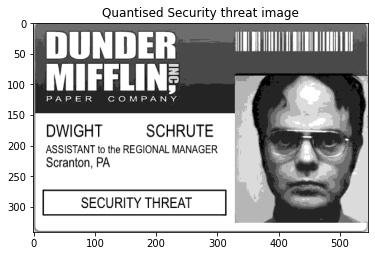

In [79]:
sec_threat4_4 = cv2.imread("../imgs/securityThreat.jpg")
hsec_threat4_4,wsec_threat4_4,channels4_4 = sec_threat4_4.shape
gray_sec4_4 = np.empty((hsec_threat4_4,wsec_threat4_4),dtype = int)
for i in range(hsec_threat4_4):
  for j in range(wsec_threat4_4):
    gray_sec4_4[i][j] = np.sum(sec_threat4_4[i][j])//3

quant_output2 = imgBitQuantizer(gray_sec4_4,3)            #### Vary the parameter k   here k = 3
plt.imshow(quant_output2,cmap = 'gray')
plt.title("Quantised Security threat image")
plt.show()

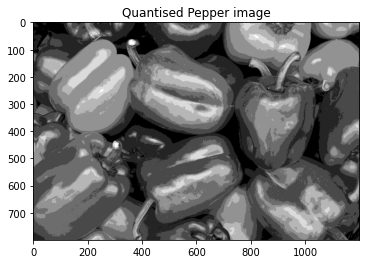

In [80]:
pepper4_4 = cv2.imread("../imgs/pepper.jpg")
hpepper4_4,wpepper4_4,channels = pepper4_4.shape
gray_pepper4_4 = np.empty((hpepper4_4,wpepper4_4),dtype = int)
for i in range(hpepper4_4):
  for j in range(wpepper4_4):
    gray_pepper4_4[i][j] = np.sum(pepper4_4[i][j])//3

quant_output3 = imgBitQuantizer(gray_pepper4_4,3)            #### Vary the parameter k   here k = 3
plt.imshow(quant_output3,cmap = 'gray')
plt.title("Quantised Pepper image")
plt.show()

It is observed reconstructed image from the higher bit planes is almost similar to original image.  


5

From 4th part, it is evident that all the bitplanes are not required to restore the original image. Visually both the images are same. So, when the image data is to be sent to other location, it can be sent with less transmission rate.  
Almost for every image, this technique can be used. But when image intensities are too low, this technique fails.

QUESTION-5

1

A)  $\gamma$ should be greater than 0.  

B) Assuming c = 1, when gamma value exceeds 1, the transformed intensities are not below 255. So, these values cannot be represented using 8-bits.  
I will modify c such that even the largest intensity value i.e., 255 will equal 255 and other values change as per the function.   
c = $\frac{1}{255^{\gamma - 1}}$  

C.When $\gamma$ is less than 1, brightness of the image get enhanced. When $\gamma$ is greater than 1, darkness is enhanced.  

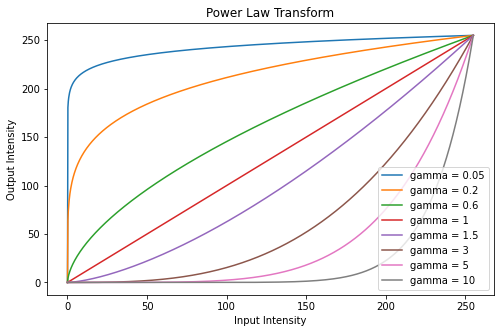

In [193]:
inp_int = list(np.linspace(0,255,1000))
gamma = [0.05,0.2,0.6,1,1.5,3,5,10]

fig = plt.figure(figsize = (8,5))
for j in gamma:
    out_int = []
    for i in inp_int:
        x = (i)**j
        y = (255)**(j - 1)
        x = x/y
        out_int.append(x)
    plt.plot(inp_int,out_int,label = f'gamma = {j}')
    plt.legend()
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.title("Power Law Transform")
plt.show()

2

In [126]:
def powerLawTransform(image,gamma):
  himage,wimage = image.shape
  #ga_imag = np.empty((himage,wimage),dtype = int)
  #for i in range(himage):
  #  for j in range(wimage):
  #      ga_imag[i][j] = int((image[i][j]**gamma)*(255**(1-gamma)))
  #return ga_imag
  image = image**gamma
  return image

3

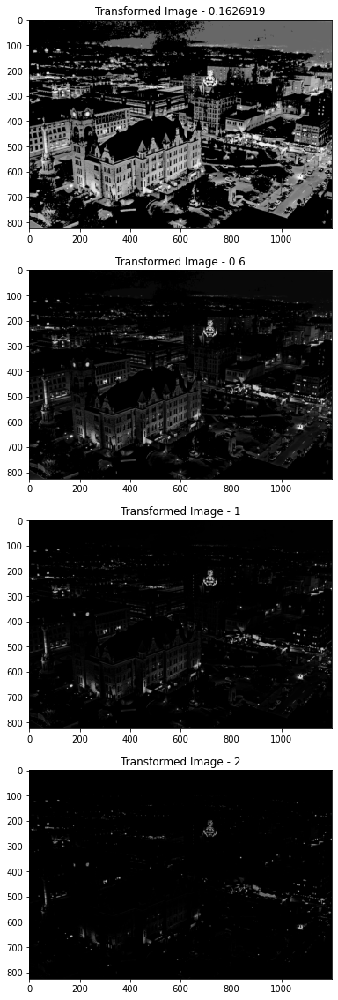

In [155]:
scrantal = cv2.imread("../imgs/scrantonAreal.png")
scrantal = scrantal[:,:,0]*(1/3) + scrantal[:,:,1]*(1/3) + scrantal[:,:,2]*(1/3)
scrantal = scrantal.astype('i')

output1 = np.array((scrantal.shape[0],scrantal.shape[1]),dtype = int)
output2 = np.array((scrantal.shape[0],scrantal.shape[1]),dtype = int)
output3 = np.array((scrantal.shape[0],scrantal.shape[1]),dtype = int)
output4 = np.array((scrantal.shape[0],scrantal.shape[1]),dtype = int)

fig = plt.figure(figsize = (30,20))
fig.add_subplot(4,1,1)
output1 = powerLawTransform(scrantal,0.1626919)
plt.imshow(output1,cmap = 'gray')
plt.title("Transformed Image - 0.1626919")

fig.add_subplot(4,1,2)
output2 = powerLawTransform(scrantal,0.6)
plt.imshow(output2,cmap = 'gray')
plt.title("Transformed Image - 0.6")

fig.add_subplot(4,1,3)
output3 = powerLawTransform(scrantal,1)
plt.imshow(output3,cmap = 'gray')
plt.title("Transformed Image - 1")

fig.add_subplot(4,1,4)
output4 = powerLawTransform(scrantal,2)
plt.imshow(output4,cmap = 'gray')
plt.title("Transformed Image - 2")
plt.show()

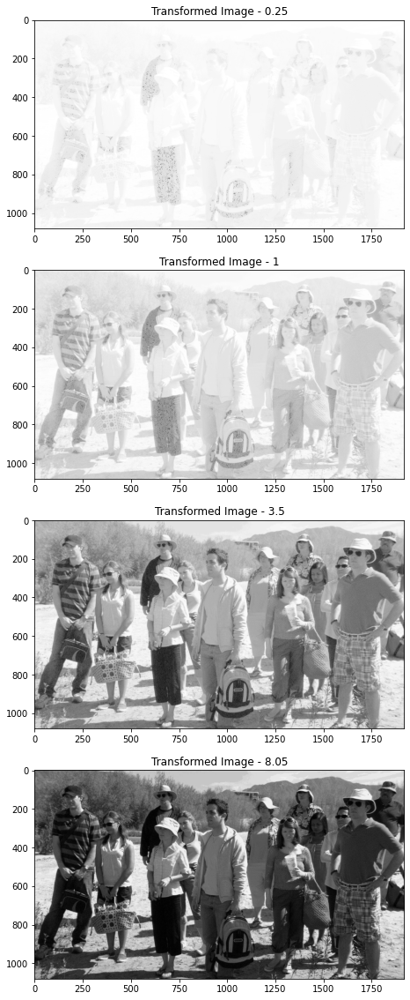

In [156]:
trip = cv2.imread("../imgs/tripGrpPhoto.png")
trip = trip[:,:,0]*(1/3) + trip[:,:,1]*(1/3) + trip[:,:,2]*(1/3)
trip = trip.astype('i')

output1 = np.array((trip.shape[0],trip.shape[1]),dtype = int)
output2 = np.array((trip.shape[0],trip.shape[1]),dtype = int)
output3 = np.array((trip.shape[0],trip.shape[1]),dtype = int)
output4 = np.array((trip.shape[0],trip.shape[1]),dtype = int)

fig = plt.figure(figsize = (30,20))
fig.add_subplot(4,1,1)
output1 = powerLawTransform(trip,0.25)
plt.imshow(output1,cmap = 'gray')
plt.title("Transformed Image - 0.25")

fig.add_subplot(4,1,2)
output2 = powerLawTransform(trip,1)
plt.imshow(output2,cmap = 'gray')
plt.title("Transformed Image - 1")

fig.add_subplot(4,1,3)
output3 = powerLawTransform(trip,3.5)
plt.imshow(output3,cmap = 'gray')
plt.title("Transformed Image - 3.5")

fig.add_subplot(4,1,4)
output4 = powerLawTransform(trip,8.05)
plt.imshow(output4,cmap = 'gray')
plt.title("Transformed Image - 8.05")
plt.show()

From the two plots, it can be observed when $\gamma$ is less than 1, brightness of the image is enhanced, when $\gamma$ is greater than 1, brightness is decreased.

4

(a) Other transform assumed is Log Transform.  
y = c*log(1 + r)  
c = 255/log(256)
r ranges from 0 to 255  
y ranges from 0 to 255 

(b)

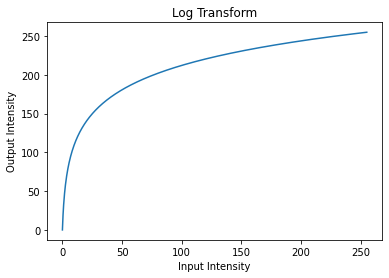

In [205]:
x = list(np.linspace(0,255,1000))
y = []
for i in range(len(x)):

    y.append((255*math.log(1 + x[i]))/math.log(256))
plt.plot(x,y)
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.title('Log Transform')
plt.show()

(c)

In [208]:
def magtransform(image):
    h,w = image.shape
    img = np.empty((h,w),dtype = int)
    for i in range(h):
        for j in range(w):
            img[i][j] = (255*math.log(1 + image[i][j]))/math.log(256)

    return img

(d)

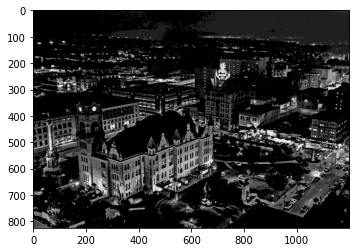

In [210]:
scrantal = cv2.imread("../imgs/scrantonAreal.png")
scrantal = scrantal[:,:,0]*(1/3) + scrantal[:,:,1]*(1/3) + scrantal[:,:,2]*(1/3)
scrantal = scrantal.astype('i')

output = np.array((scrantal.shape[0],scrantal.shape[1]),dtype = int)
output = magtransform(scrantal)
plt.imshow(output,cmap = 'gray')
plt.show()

QUESTION - 6

1

In [212]:
def hist_equal(image):
  himage,wimage=image.shape
  flatten_image = image.flatten()

  freq_values,binvalues = np.histogram(flatten_image, bins= [i for i in range(256)],density = True )
  zipped = dict(zip(binvalues,freq_values))

  s = {}
  for j in range(256):
    s[j] = int(255*sum(freq_values[:j+1]))

  image_equal = np.empty((himage,wimage),dtype = int)
  for i in range(himage):
    for j in range(wimage):
      image_equal[i][j] = s[image[i][j]]
  
  return image_equal,s

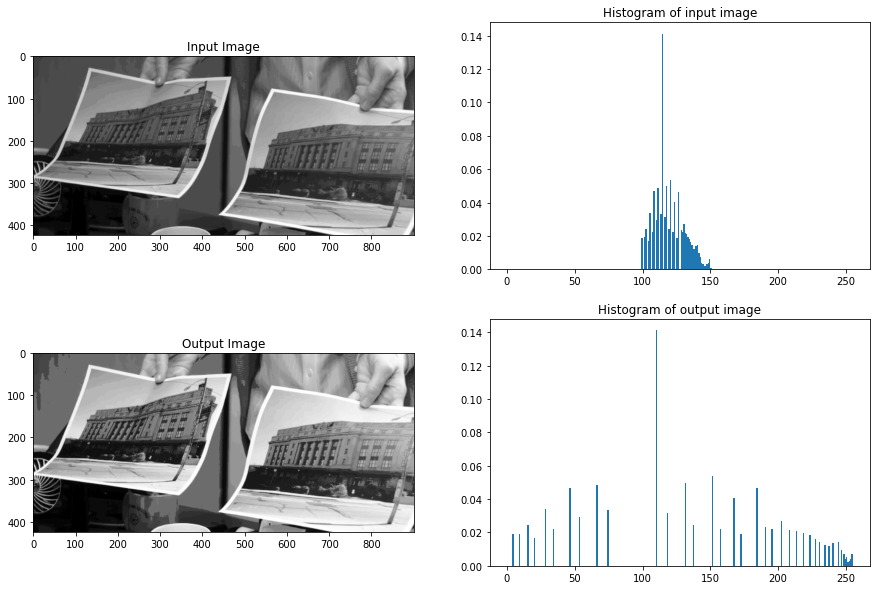

In [217]:
picture = cv2.imread("../imgs/Same_picture.png")
picture = picture[:,:,0]*(1/3) + picture[:,:,1]*(1/3) + picture[:,:,2]*(1/3)
picture = picture.astype('i')
h,w= picture.shape
return_image = np.empty((h,w),dtype = int)

flat_input = picture.flatten()
fig = plt.figure(figsize = (15,10))
rows = 2
columns = 2

fig.add_subplot(rows,columns,1)
plt.imshow(picture,cmap = 'gray')
plt.title('Input Image')
fig.add_subplot(rows,columns,2)
plt.hist(flat_input, bins= [i for i in range(256)],density = True )
plt.title('Histogram of input image')


return_image,tf = hist_equal(picture)
flat_output = return_image.flatten()

fig.add_subplot(rows,columns,3)
plt.imshow(return_image,cmap = 'gray')
plt.title('Output Image')

fig.add_subplot(rows,columns,4)
plt.hist(flat_output, bins= [i for i in range(256)],density = True )
plt.title('Histogram of output image')
plt.show()


In the input image, intensity values are limited to certain intensities(low contrast) and in the output image contrast enhanced. In the input image, the locations where the intensity values are moderately bright, became bright due to equalization and the locations where the intensity is moderately dark, became darker.

2

In [218]:
def hist_match(inp_img,ref_img):
  inpheight,inpwidth = inp_img.shape
  inp_equ,s1 = hist_equal(inp_img)
  ref_equ,s2 = hist_equal(ref_img) 
  
  pix = [0 for elem in range(256)]
  s1_vals = np.array(list(s1.values()))
  s2_vals = np.array(list(s2.values()))
  for i in range(256):
    
    s21_vals = s2_vals
    s21_vals = abs(s21_vals - s1_vals[i])


    min_index = np.where(s21_vals == np.amin(s21_vals))
    pix[i] = min_index[0][0]
  spec_imag = np.empty((inpheight,inpwidth),dtype = int)
  for i in range(inpheight):
    for j in range(inpwidth):
        spec_imag[i][j] = pix[inp_img[i][j]]
    
  return spec_imag

(a)

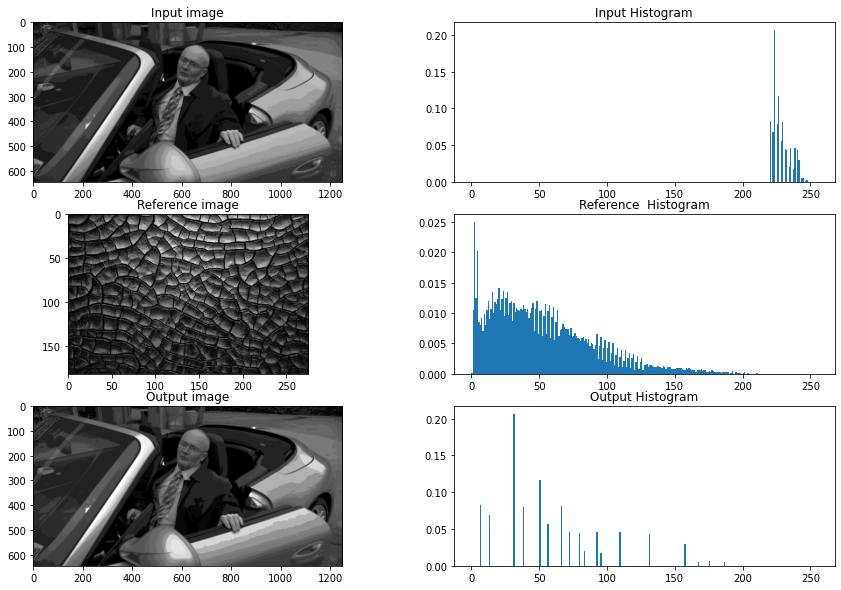

In [223]:
inp = cv2.imread("../imgs/Creed.png")
inp = inp[:,:,0]*(1/3) + inp[:,:,1]*(1/3) + inp[:,:,2]*(1/3)
inp = inp.astype('i')
ref = cv2.imread("../imgs/Texture.jpg")
ref = ref[:,:,0]*(1/3) + ref[:,:,1]*(1/3) + ref[:,:,2]*(1/3)
ref = ref.astype('i')

out_image = hist_match(inp,ref)

fig = plt.figure(figsize = (15,10))
fig.add_subplot(3,2,1)
plt.imshow(inp,cmap = 'gray')
plt.title('Input image')
fig.add_subplot(3,2,2)
plt.hist(inp.flatten(),bins= [i for i in range(256)],density = True)
plt.title('Input Histogram')

fig.add_subplot(3,2,3)
plt.imshow(ref,cmap = 'gray')
plt.title('Reference image')
fig.add_subplot(3,2,4)
plt.hist(ref.flatten(),bins= [i for i in range(256)],density = True)
plt.title('Reference  Histogram')

fig.add_subplot(3,2,5)
plt.imshow(out_image,cmap = 'gray')
plt.title('Output image')
fig.add_subplot(3,2,6)
plt.hist(out_image.flatten(),bins= [i for i in range(256)],density = True)
plt.title('Output Histogram')




plt.show()

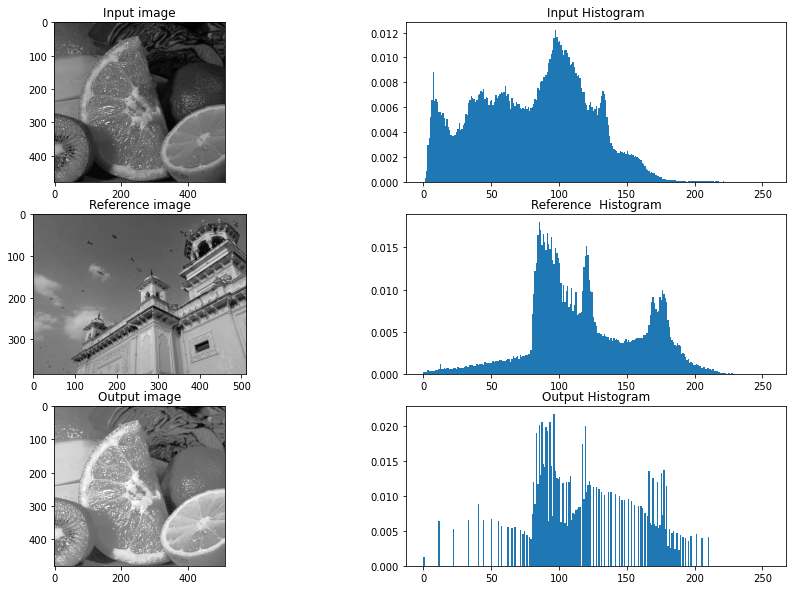

In [225]:
inp = cv2.imread("../imgs/orange.jpg")
inp = inp[:,:,0]*(1/3) + inp[:,:,1]*(1/3) + inp[:,:,2]*(1/3)
inp = inp.astype('i')
ref = cv2.imread("../imgs/building.jpg")
ref = ref[:,:,0]*(1/3) + ref[:,:,1]*(1/3) + ref[:,:,2]*(1/3)
ref = ref.astype('i')

out_image = hist_match(inp,ref)

fig = plt.figure(figsize = (15,10))
fig.add_subplot(3,2,1)
plt.imshow(inp,cmap = 'gray')
plt.title('Input image')
fig.add_subplot(3,2,2)
plt.hist(inp.flatten(),bins= [i for i in range(256)],density = True)
plt.title('Input Histogram')

fig.add_subplot(3,2,3)
plt.imshow(ref,cmap = 'gray')
plt.title('Reference image')
fig.add_subplot(3,2,4)
plt.hist(ref.flatten(),bins= [i for i in range(256)],density = True)
plt.title('Reference  Histogram')

fig.add_subplot(3,2,5)
plt.imshow(out_image,cmap = 'gray')
plt.title('Output image')
fig.add_subplot(3,2,6)
plt.hist(out_image.flatten(),bins= [i for i in range(256)],density = True)
plt.title('Output Histogram')
plt.show()

QUESTION - 7

7.1.1

1

In [263]:
def meanFilter(image,k):
  h,w = image.shape
  filtered_image = np.empty((h,w),dtype = int)
  pad_image = np.pad(image, (k//2, k//2), 'constant', constant_values=(0))
  for i in range(h):
    for j in range(w):
        sum = 0
        for l in range( i , i + k):
            for r in range(j,j + k):
                sum += pad_image[l][r]
        filtered_image[i][j] = (sum/(k*k))

  return filtered_image

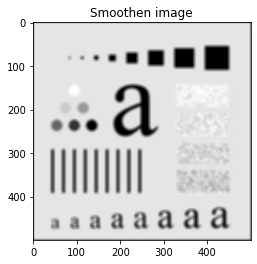

In [269]:
image = cv2.imread("../imgs/testPattern.jpg")
image = image[:,:,0]*(1/3) + image[:,:,1]*(1/3) + image[:,:,2]*(1/3)
image = image.astype('i')
img_out1 = np.empty((image.shape[0],image.shape[1]),dtype = int)

k =9
img_out1 = meanFilter(image,k)
plt.imshow(img_out1,cmap = 'gray')
plt.title('Smoothen image')
plt.show()

2

In [271]:
def effMeanFilter(image,k):
  h,w = image.shape
  filtered_image = np.empty((h,w),dtype = int)
  kernel = np.ones((k,k),dtype = int)
  pad_image = np.pad(image, (k//2, k//2), 'constant', constant_values=(0))
  for i in range(h):
    for j in range(w):
      if j == 0:
        sumi = np.sum(np.multiply(pad_image[i:i + k,j:j + k],kernel).flatten())
        filtered_image[i][j] = sumi/(k**2)
      else:
        sub = np.sum(np.dot(pad_image[i:i + k,j-1:j],kernel[0:1,0:k]))
        add = np.sum(np.dot(pad_image[i:i + k,j + k -1:j+k],kernel[0:1,0:k]))
        sumi =  sumi - sub + add
        filtered_image[i][j] =sumi/(k**2)
        #filtered_image[i][j] = filtered_image[i][j]/(k**2)
  return filtered_image

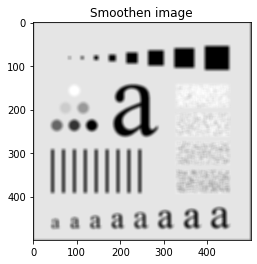

In [272]:
image = cv2.imread("../imgs/testPattern.jpg")
image = image[:,:,0]*(1/3) + image[:,:,1]*(1/3) + image[:,:,2]*(1/3)
image = image.astype('i')
img_out2 = np.empty((image.shape[0],image.shape[1]),dtype = int)

k = 9
img_out2 = effMeanFilter(image,k)
plt.imshow(img_out2,cmap = 'gray')
plt.title('Smoothen image')
plt.show()

In [273]:
print(np.array_equal(img_out1,img_out2))


False


3

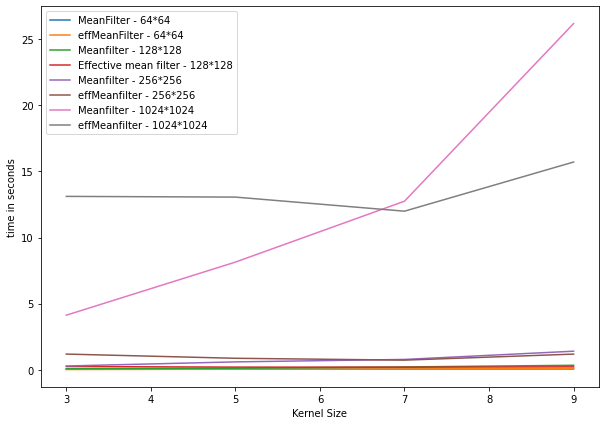

In [278]:
image = cv2.imread("../imgs/testPattern.jpg")
image = image[:,:,0]*(1/3) + image[:,:,1]*(1/3) + image[:,:,2]*(1/3)
image = image.astype('i')

img1 = np.empty((64,64),dtype = int)
for i in range(64):
  for j in range(64):
    img1[i][j] = i + j
img2 = np.ones((128,128),dtype = int)
for i in range(128):
  for j in range(128):
    img2[i][j] = i + j
img3 = np.ones((256,256),dtype = int)
for i in range(256):
  for j in range(256):
    img3[i][j] = i + j
img4 = np.ones((1024,1024),dtype = int)
for i in range(1024):
  for j in range(1024):
    img4[i][j] = i + j

#64
t64 = []
te64 = []
t128 = []
te128 = []
t256 = []
te256 = []
t1024 = []
te1024 = []

k = [3,5,7,9]
for i in k:
  t1 = time.time()
  out = meanFilter(img1,i)
  t2 = time.time()
  t64.append(t2-t1)
  t3 = time.time()
  out = effMeanFilter(img1,i)
  t4 = time.time()
  te64.append(t4-t3)
  
  t1 = time.time()
  out = meanFilter(img2,i)
  t2 = time.time()
  t128.append(t2-t1)
  t3 = time.time()
  out = effMeanFilter(img2,i)
  t4 = time.time()
  te128.append(t4-t3)

  t1 = time.time()
  out = meanFilter(img3,i)
  t2 = time.time()
  t256.append(t2-t1)
  t3 = time.time()
  out = effMeanFilter(img3,i)
  t4 = time.time()
  te256.append(t4-t3)

  t1 = time.time()
  out = meanFilter(img4,i)
  t2 = time.time()
  t1024.append(t2-t1)
  t3 = time.time()
  out = effMeanFilter(img4,i)
  t4 = time.time()
  te1024.append(t4-t3)


fig = plt.figure(figsize = (10,7))

plt.plot(k,te64,label = 'MeanFilter - 64*64')

plt.plot(k,t64,label = 'effMeanFilter - 64*64')

plt.plot(k,t128,label = 'Meanfilter - 128*128')
plt.plot(k,te128,label = 'Effective mean filter - 128*128')
plt.plot(k,t256,label = 'Meanfilter - 256*256')
plt.plot(k,te256,label = 'effMeanfilter - 256*256')
plt.plot(k,t1024,label = 'Meanfilter - 1024*1024')
plt.plot(k,te1024,label = 'effMeanfilter - 1024*1024')
plt.xlabel('Kernel Size')
plt.ylabel('time in seconds')
plt.legend()
plt.show()

4

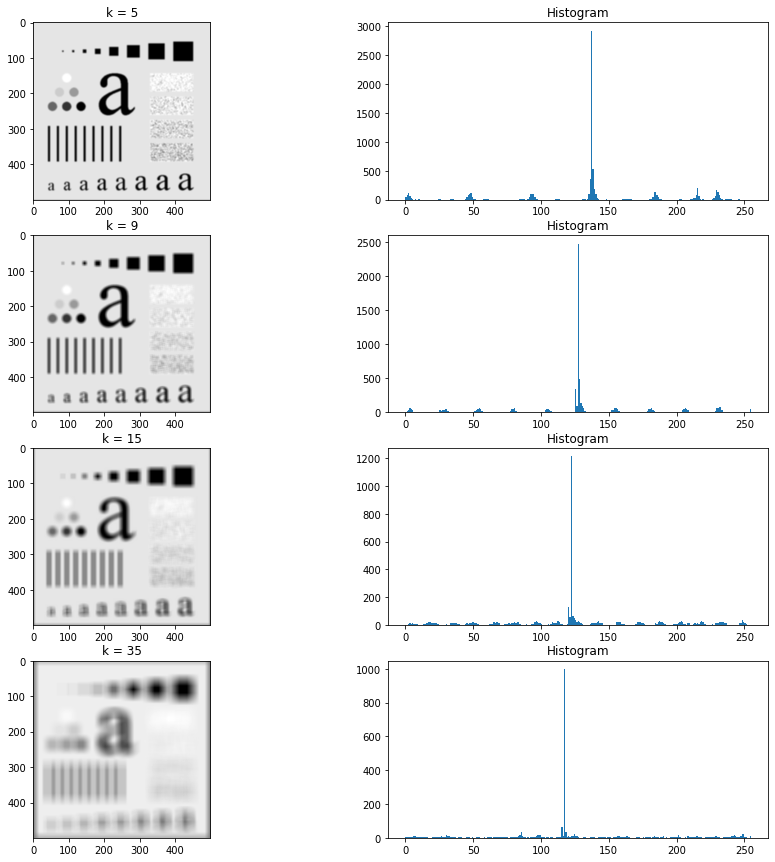

In [277]:
image = cv2.imread("../imgs/testPattern.jpg")
image = image[:,:,0]*(1/3) + image[:,:,1]*(1/3) + image[:,:,2]*(1/3)
image = image.astype('i')

k = [5,9,15,35]
fig = plt.figure(figsize = (15,15))
rows = 4
columns = 2
g = 1
for i in range(len(k)):
  out = effMeanFilter(image,k[i])
  
  fig.add_subplot(rows,columns,g)
  g += 1
  plt.imshow(out,cmap = 'gray')
  plt.title(f'k = {k[i]}')
  fig.add_subplot(rows,columns,g)
  g += 1
  plt.hist(out.flatten(),bins = [k for k in range(256)])
  plt.title('Histogram')
plt.show()

As the kernel size increases, the blurring is increased, this is evident from the histogram, where the distribution is more spread.  
 

7.1.2

1

a

In [279]:
def approx1DGaussFilter1(k):
  kernel = np.empty(k, dtype = int)
  n = math.factorial(k-1)
  for i in range(k):
    r = math.factorial(i)*math.factorial(k-1-i)
    kernel[i] = (n/r)

  sd = sum(kernel)/(math.sqrt(2*math.pi)*kernel[k//2])
  return kernel,sd

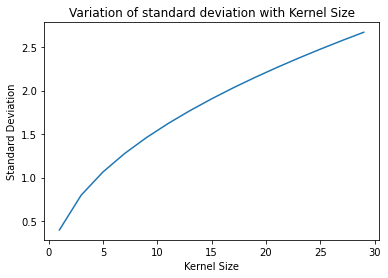

In [283]:
k = []
sd = []
for i in range(1,30,2):
  k1,sd1 = approx1DGaussFilter1(i)
   
  k.append(i)
  sd.append(sd1)
plt.plot(k,sd)
plt.xlabel("Kernel Size")
plt.ylabel("Standard Deviation")
plt.title("Variation of standard deviation with Kernel Size")
plt.show()

b

In [288]:
def closest(lst, K):
      
    return lst[min(range(len(lst)), key = lambda i: abs(lst[i]-K))]


def approx1DGaussFilter2(std):
  kout = []
  std_k_pair = {}
  for i in range(1,20,2):
    kernalsample,stdi = approx1DGaussFilter1(i)
    std_k_pair[stdi] = kernalsample
  #print(std_k_pair)
  std_suit = closest(list(std_k_pair.keys()),std)
  #print(std)
  #print(std_k_pair)
  kernal = std_k_pair[std_suit]
  #print(kernal)
  sum_kernal = sum(kernal)
  std = std_suit
  #print(kernal)
  k = len(kernal)  
  kernal_max = kernal[k//2]
  #mf = kernal_max*math.sqrt(2*math.pi)*std
  kernal = list(kernal)[:k//2]
  kernal_fix = kernal
  
  i = 1.5
  while(i<4.0):
    kernal = kernal_fix.copy()
    
    exp_term = -((i*std)**2)/(2*(std)**2)
    gaussian_min =int((math.exp(exp_term)/(math.sqrt(2*math.pi)*std))*sum_kernal)#*mf
    #print((math.exp(exp_term)/(math.sqrt(2*math.pi)*std))*sum_kernal)
    #print(gaussian_min)
    if gaussian_min <= min(kernal):
      if gaussian_min == 0:
        kernal.append(gaussian_min)
        kernal = sorted(kernal)
      else:
        kernal.append(gaussian_min)
        kernal = sorted(list(np.unique(np.array(kernal))))
    else:
      kernal.append(gaussian_min)
      kernal = sorted(list(np.unique(np.array(kernal))))
      while(kernal[0] != gaussian_min):
        kernal.pop(0)

    kernal_r = list(reversed(kernal))
    kernal.append(kernal_max)
    kernal =  kernal  +  kernal_r      # kernal + list(kernal_max) +
    #print(kernal_fix)
    kout.append(kernal)
    i += 1

  return kout

In [289]:
print(approx1DGaussFilter2(1))

[[1, 4, 6, 4, 1], [0, 1, 4, 6, 4, 1, 0], [0, 1, 4, 6, 4, 1, 0]]


2

a

In [496]:
def gaussian2d(x,y,std):
  exp_term = -(x**2 + y**2)/(2*std**2)
  gaussian_value = math.exp(exp_term)/(2*math.pi*std**2)
  return gaussian_value

def gaussKernelGenerator(std,k):
  kernal = np.empty((k,k),dtype = int)
  for i in range(k):
    for j in range(k):
      #if  i == k//2 and j == k//2:
        #print(gaussian2d(0,0,std)*2*math.pi*std)
      kernal[i][j] = (gaussian2d(3*std*((i-(k//2))/(k//2)),3*std*((j-(k//2))/(k//2)),std))#*2*math.pi*std)
      #kernal[i][j] = round(gaussian2d(i-(k//2),j-(k//2),std))#*2*math.pi*std)

  return kernal

In [333]:
arr = gaussKernelGenerator(0.05,5)
print(arr)

[[ 0  0  0  0  0]
 [ 0  6 20  6  0]
 [ 0 20 63 20  0]
 [ 0  6 20  6  0]
 [ 0  0  0  0  0]]


b

In [295]:
def approx2DGaussFilter(std):
  kernals = approx1DGaussFilter2(std)
  req_kernal = np.array(kernals[1])
  length  = len(req_kernal)
  req_kernal = req_kernal.reshape((length,1))
  req_kernal_t = req_kernal.reshape((1,length))
 
  gaussian_two = np.dot(req_kernal,req_kernal_t)
  
  return gaussian_two
  

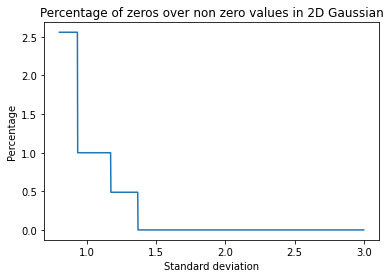

In [301]:
x = list(np.linspace(0.8,3,1000))
percentage = []
for i in x:
  gaussian = approx2DGaussFilter(i)
  length = len(gaussian.flatten())
  non_zeros = np.count_nonzero(gaussian.flatten())
  zeros = length - non_zeros
  percent = (zeros/(length**2))*100
  percentage.append(percent)
plt.plot(x,percentage)
plt.title("Percentage of zeros over non zero values in 2D Gaussian")
plt.xlabel('Standard deviation')
plt.ylabel('Percentage')
plt.show()

c

In [302]:
def gaussianFilter(im,var,k):
  kernal = gaussKernelGenerator(var,k)
  sumi_Gaussian = sum(kernal.flatten())
  h,w = im.shape
  Gauss_image = np.empty((h,w),dtype = int)
  pad_image = np.pad(im, (k//2, k//2), 'constant', constant_values=(0))
  for i in range(h):
    for j in range(w):
        sumi = 0
        row,column = 0,0
        for l in range((k//2 + i - k//2), (k//2 + i+ k//2 + 1)):
            column = 0
            for r in range((k//2 + j - k//2),(k//2 + j+1+ k//2)):
                
                sumi += pad_image[l][r]*kernal[row][column]
                column += 1
            row += 1

        Gauss_image[i][j] = sumi/sumi_Gaussian

  return Gauss_image

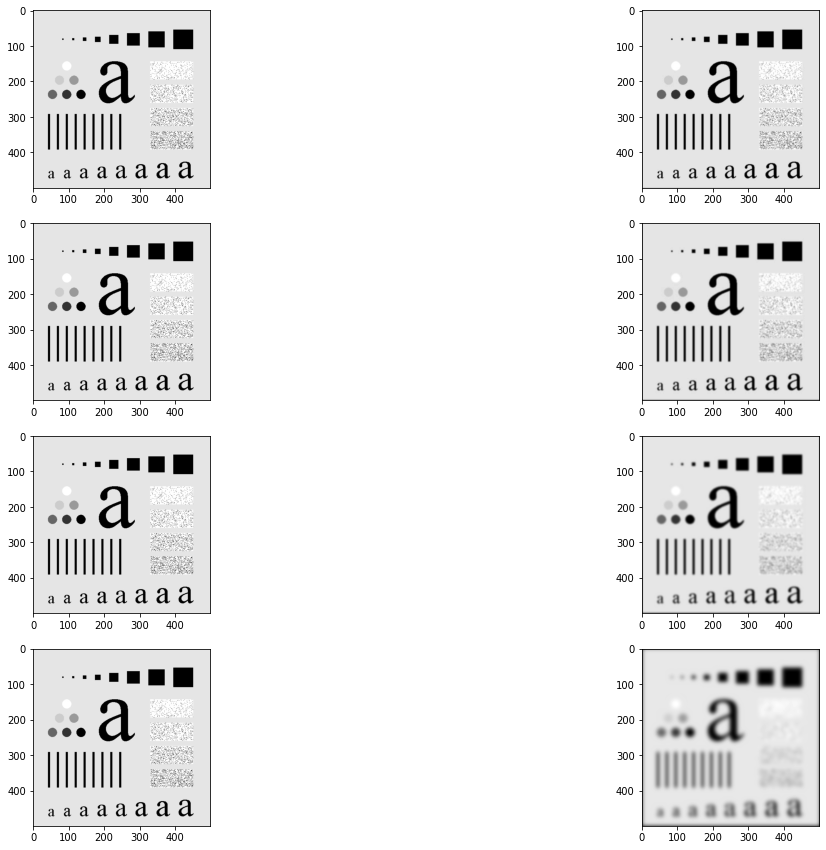

In [303]:
image = cv2.imread("../imgs/testPattern.jpg")
image = image[:,:,0]*(1/3) + image[:,:,1]*(1/3) + image[:,:,2]*(1/3)
image = image.astype('i')

out = gaussianFilter(image,0.005,5)
out1 = gaussianFilter(image,0.05,9)
out2 = gaussianFilter(image,0.05,15)
out3 = gaussianFilter(image,0.05,35)
fig = plt.figure(figsize = (20,15))
rows,columns = 4,2

fig.add_subplot(rows,columns,1)
plt.imshow(image,cmap = 'gray')
fig.add_subplot(rows,columns,2)
plt.imshow(out,cmap = 'gray')

fig.add_subplot(rows,columns,3)
plt.imshow(image,cmap = 'gray')
fig.add_subplot(rows,columns,4)
plt.imshow(out1,cmap = 'gray')

fig.add_subplot(rows,columns,5)
plt.imshow(image,cmap = 'gray')
fig.add_subplot(rows,columns,6)
plt.imshow(out2,cmap = 'gray')

fig.add_subplot(rows,columns,7)
plt.imshow(image,cmap = 'gray')
fig.add_subplot(rows,columns,8)
plt.imshow(out3,cmap = 'gray')

d

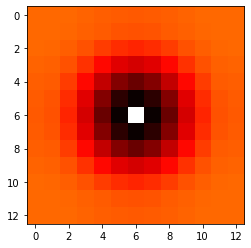

In [503]:
g1 = gaussKernelGenerator(0.023,13)
g2 = approx2DGaussFilter(20)
g = g1 - g2
plt.imshow(g,cmap = "hot")
plt.show()

7.2

1

In [306]:
def nonlinearFilter(image,operation,k):
  h,w = image.shape
  filtered_image = np.empty((h,w),dtype = int)
  pad_image = np.pad(image, (k//2, k//2), 'constant', constant_values=(0))
  for i in range(h):
    for j in range(w):
        

        neighbour = []
        for l in range((k//2 + i - k//2), (k//2 + i+ k//2 + 1)):
            for r in range((k//2 + j - k//2),(k//2 + j+1+ k//2)):
                neighbour.append(pad_image[l][r])
        neighbour = sorted(neighbour)

        if operation == 'max':
            filtered_image[i][j] = max(neighbour)
        elif operation == 'min':
            filtered_image[i][j] = min(neighbour)
        elif operation == 'median':
            filtered_image[i][j] = neighbour[(k*k)//2]

  return filtered_image

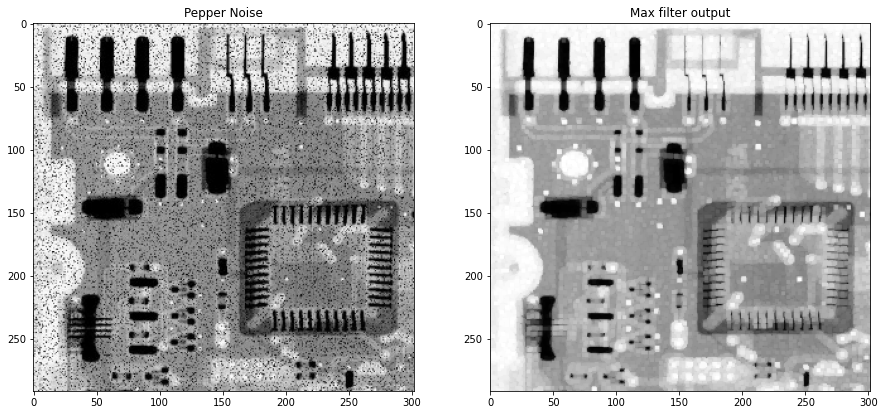

In [308]:
noisy1 = cv2.imread("../imgs/noisy1.jpeg")
noisy1 = noisy1[:,:,0]*(1/3) + noisy1[:,:,1]*(1/3) + noisy1[:,:,2]*(1/3)
noisy1 = noisy1.astype('i')

denoise = nonlinearFilter(noisy1,'max',3)
fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(noisy1,cmap = 'gray')
plt.title('Pepper Noise')
fig.add_subplot(1,2,2)
plt.imshow(denoise,cmap = 'gray')
plt.title('Max filter output')
plt.show()

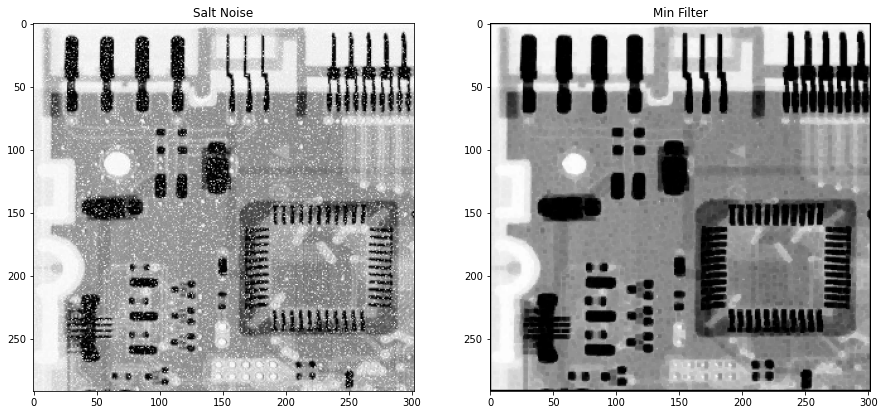

In [309]:
noisy2 = cv2.imread("../imgs/noisy2.jpeg")
noisy2 = noisy2[:,:,0]*(1/3) + noisy2[:,:,1]*(1/3) + noisy2[:,:,2]*(1/3)
noisy2 = noisy2.astype('i')
denoise = nonlinearFilter(noisy2,'min',3)
fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(noisy2,cmap = 'gray')
plt.title('Salt Noise')
fig.add_subplot(1,2,2)
plt.imshow(denoise,cmap = 'gray')
plt.title('Min Filter')
plt.show()

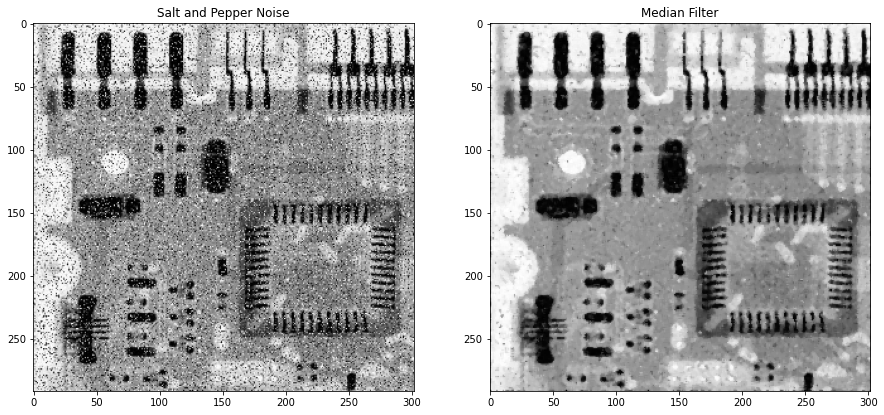

In [313]:
noisy3 = cv2.imread("../imgs/noisy3.jpeg")
noisy3 = noisy3[:,:,0]*(1/3) + noisy3[:,:,1]*(1/3) + noisy3[:,:,2]*(1/3)
noisy3 = noisy3.astype('i')
denoise = nonlinearFilter(noisy3,'median',3)

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(noisy3,cmap = 'gray')
plt.title('Salt and Pepper Noise')
fig.add_subplot(1,2,2)
plt.imshow(denoise,cmap = 'gray')
plt.title('Median Filter')
plt.show()

2

In [314]:
def effMedianFilter(image,k):
  h,w = image.shape
  filtered_image = np.zeros((h,w),dtype = int)
  pad_image = np.pad(image, (k//2, k//2), 'constant', constant_values=(0))
  for i in range(h):
    for j in range(w):
      if j == 0:
        vals = pad_image[i:i + k,j:j + k]
        filtered_image[i][j] = np.median(vals.flatten())
      else:
        vals = np.delete(vals,0,axis = 1)
        add = pad_image[i:i + k,j + k -1:j+k]
        vals = np.append(vals, add, axis=1)
        
        filtered_image[i][j] = np.median(vals.flatten())
        #filtered_image[i][j] = filtered_image[i][j]/(k**2)
  return filtered_image

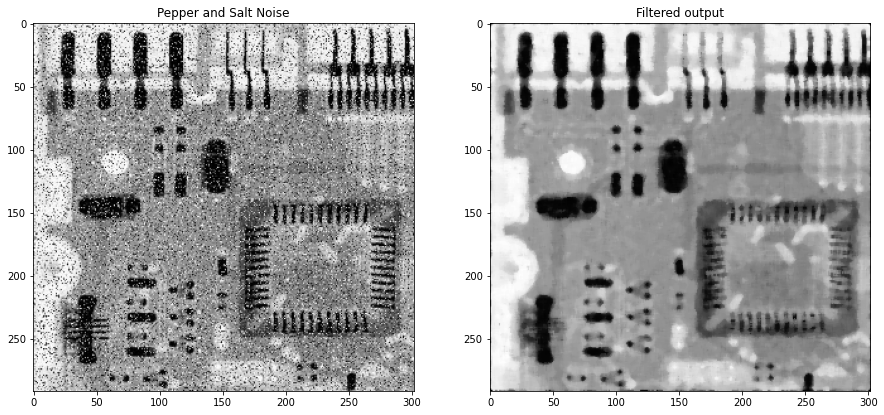

In [317]:
noisy3 = cv2.imread("../imgs/noisy3.jpeg")
noisy3 = noisy3[:,:,0]*(1/3) + noisy3[:,:,1]*(1/3) + noisy3[:,:,2]*(1/3)
noisy3 = noisy3.astype('i')
denoise = effMedianFilter(noisy3,5)

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(noisy3,cmap = 'gray')
plt.title('Pepper and Salt Noise')
fig.add_subplot(1,2,2)
plt.imshow(denoise,cmap = 'gray')
plt.title('Filtered output')
plt.show()

7.3

1

In [511]:
def edgedetection(image,kernel,k):
  detectors = {'Prewittx3':np.array([[-1,0,1],[-1,0,1],[-1,0,1]]),
               'Prewitty3':np.array([[-1,-1,-1],[0,0,0],[1,1,1]]),
               'Sobelx3':np.array([[-1,0,1],[-2,0,2],[-1,0,1]]),
               'Sobely3':np.array([[-1,-2,-1],[0,0,0],[1,2,1]]),
               'Laplacian1':np.array([[0,1,0],[1,-4,1],[0,1,0]]),
               'Laplacian2':np.array([[1,1,1],[1,-8,1],[1,1,1]]),
               'Prewittx5':np.array([[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2]]),
               'Prewitty5':np.array([[-2,-2,-2,-2,-2],[-1,-1,-1,-1,-1],[0,0,0,0,0],[1,1,1,1,1],[2,2,2,2,2]]),
               'Sobelx5':np.array([[-2,-1,0,1,2],[-2,-1,0,1,2],[-4,-2,0,2,4],[-2,-1,0,1,2],[-2,-1,0,1,2]]),
               'Sobely5':np.array([[-2,-2,-4,-2,-2],[-1,-1,-2,-1,-1],[0,0,0,0,0],[1,1,2,1,1],[2,2,4,2,2]]),
               'Robertsx':np.array([[0,1],[-1,0]]),
               'Robertsy':np.array([[1,0],[0,-1]])
               }
  h,w = image.shape
  filtered_image = np.zeros((h,w),dtype = int)
  pad_image = np.pad(image, (k//2, k//2), 'constant', constant_values=(0))

  for i in range(h):
    for j in range(w):
      
        sum = np.sum(np.multiply(pad_image[i:i + k,j:j + k],detectors[kernel]).flatten())
        filtered_image[i][j] = sum
      
  return filtered_image

Prewitt Filter

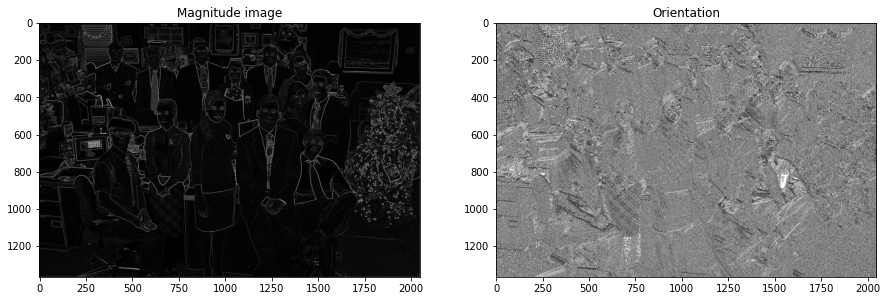

In [338]:
office = cv2.imread("../imgs/office.jpg")
office = office[:,:,0]*(1/3) + office[:,:,1]*(1/3) + office[:,:,2]*(1/3)
office = office.astype('i')
h,w = office.shape
Prewitt_m = np.empty((h,w),dtype = int)
Prewitt_o = np.empty((h,w),dtype = int)


Px = edgedetection(office,'Prewittx3',3)
Py = edgedetection(office,'Prewitty3',3)




for i in range(h):
  for j in range(w):
      Prewitt_m[i][j] = round(np.sqrt((Px[i][j]**2) + (Py[i][j]**2)))
for i in range(h):
  for j in range(w):
    if Px[i][j] != 0:
      Prewitt_o[i][j] = round(np.arctan(Py[i][j]/Px[i][j]))
    else:
      Prewitt_o[i][j] = 2

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(Prewitt_m,cmap = 'gray')
plt.title("Magnitude image")
fig.add_subplot(1,2,2)
plt.imshow(Prewitt_o,cmap = 'gray')
plt.title("Orientation")
plt.show()

Sobel Filter

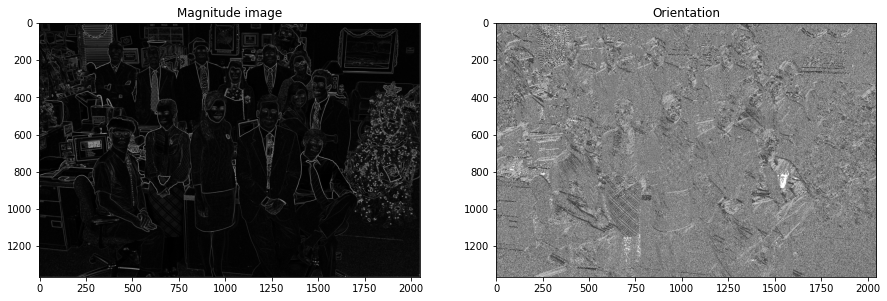

In [340]:
office = cv2.imread("../imgs/office.jpg")
office = office[:,:,0]*(1/3) + office[:,:,1]*(1/3) + office[:,:,2]*(1/3)
h,w = office.shape
Sobel_m = np.empty((h,w),dtype = int)
Sobel_o = np.empty((h,w),dtype = int)
office = office.astype('i')

Sx = edgedetection(office,'Sobelx3',3)
Sy = edgedetection(office,'Sobely3',3)




for i in range(h):
  for j in range(w):
      Sobel_m[i][j] = round(np.sqrt((Sx[i][j]**2) + (Sy[i][j]**2)))
for i in range(h):
  for j in range(w):
    if Sx[i][j] != 0:
      Sobel_o[i][j] = round(np.arctan(Sy[i][j]/Sx[i][j]))
    else:
      Sobel_o[i][j] = 2

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(Sobel_m,cmap = 'gray')
plt.title("Magnitude image")
fig.add_subplot(1,2,2)
plt.imshow(Sobel_o,cmap = 'gray')
plt.title("Orientation")
plt.show()

Laplacian Filter

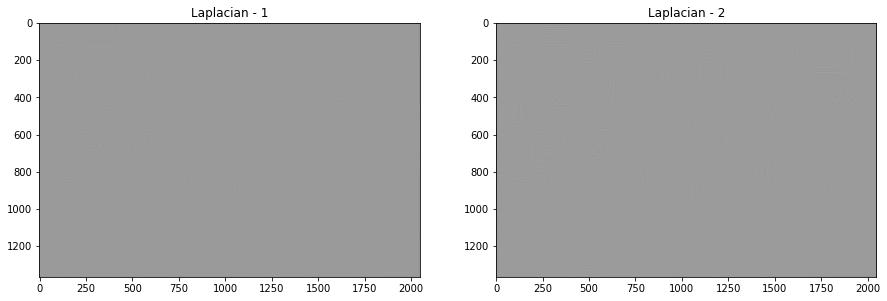

In [339]:
office = cv2.imread("../imgs/office.jpg")
office = office[:,:,0]*(1/3) + office[:,:,1]*(1/3) + office[:,:,2]*(1/3)
h,w = office.shape
l1 = np.empty((h,w),dtype = int)
l2 = np.empty((h,w),dtype = int)
office = office.astype('i')

l1 = edgedetection(office,'Laplacian1',3)
l2 = edgedetection(office,'Laplacian2',3)

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(l1,cmap = 'gray')
plt.title("Laplacian - 1")
fig.add_subplot(1,2,2)
plt.imshow(l2,cmap = 'gray')
plt.title("Laplacian - 2")
plt.show()

Roberts Filter

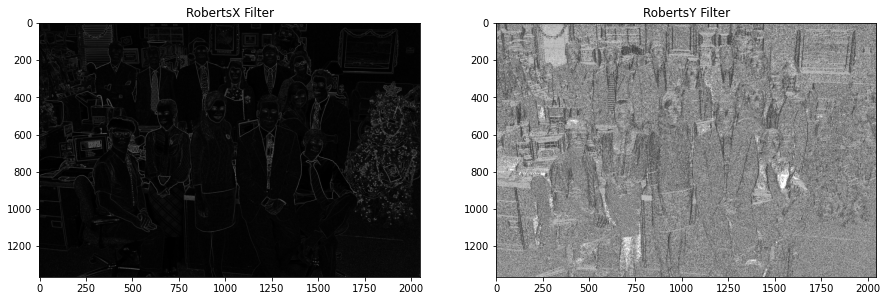

In [515]:
office = cv2.imread("../imgs/office.jpg")
office = office[:,:,0]*(1/3) + office[:,:,1]*(1/3) + office[:,:,2]*(1/3)
h,w = office.shape
l1 = np.empty((h,w),dtype = int)
l2 = np.empty((h,w),dtype = int)

Roberts_m = np.empty((h,w),dtype = int)
Roberts_o = np.empty((h,w),dtype = int)
office = office.astype('i')

l1 = edgedetection(office,'Robertsx',2)
l2 = edgedetection(office,'Robertsy',2)

for i in range(h):
  for j in range(w):
      Roberts_m[i][j] = round(np.sqrt((l1[i][j]**2) + (l2[i][j]**2)))
for i in range(h):
  for j in range(w):
    if l1[i][j] != 0:
      Roberts_o[i][j] = round(np.arctan(l2[i][j]/l1[i][j]))
    else:
      Roberts_o[i][j] = 2

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(Roberts_m,cmap = 'gray')
plt.title("RobertsX Filter")
fig.add_subplot(1,2,2)
plt.imshow(Roberts_o,cmap = 'gray')
plt.title("RobertsY Filter")
plt.show()

2

Prewitt Filter

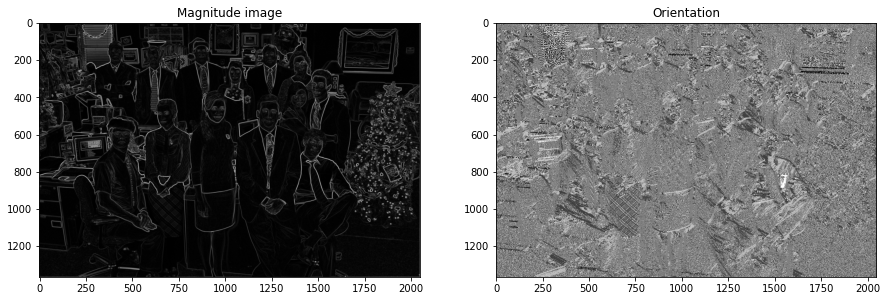

In [342]:
office = cv2.imread("../imgs/office.jpg")
office = office[:,:,0]*(1/3) + office[:,:,1]*(1/3) + office[:,:,2]*(1/3)
office = office.astype('i')
h,w = office.shape
Prewitt_m = np.empty((h,w),dtype = int)
Prewitt_o = np.empty((h,w),dtype = int)


Px = edgedetection(office,'Prewittx5',5)
Py = edgedetection(office,'Prewitty5',5)




for i in range(h):
  for j in range(w):
      Prewitt_m[i][j] = round(np.sqrt((Px[i][j]**2) + (Py[i][j]**2)))
for i in range(h):
  for j in range(w):
    if Px[i][j] != 0:
      Prewitt_o[i][j] = round(np.arctan(Py[i][j]/Px[i][j]))
    else:
      Prewitt_o[i][j] = 2

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(Prewitt_m,cmap = 'gray')
plt.title("Magnitude image")
fig.add_subplot(1,2,2)
plt.imshow(Prewitt_o,cmap = 'gray')
plt.title("Orientation")
plt.show()

Sobel Filter

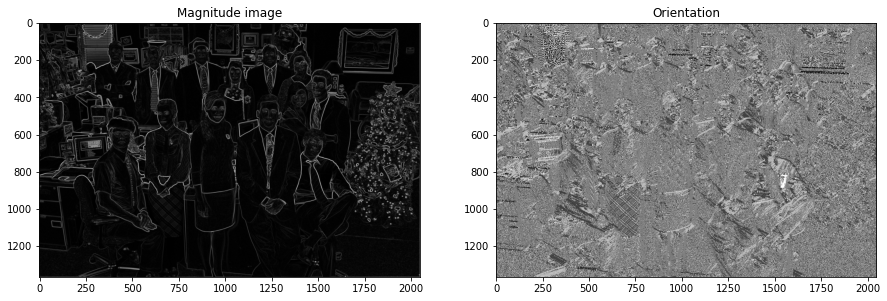

In [341]:
office = cv2.imread("../imgs/office.jpg")
office = office[:,:,0]*(1/3) + office[:,:,1]*(1/3) + office[:,:,2]*(1/3)
h,w = office.shape
Sobel_m = np.empty((h,w),dtype = int)
Sobel_o = np.empty((h,w),dtype = int)
office = office.astype('i')

Sx = edgedetection(office,'Sobelx5',5)
Sy = edgedetection(office,'Sobely5',5)




for i in range(h):
  for j in range(w):
      Sobel_m[i][j] = round(np.sqrt((Sx[i][j]**2) + (Sy[i][j]**2)))
for i in range(h):
  for j in range(w):
    if Sx[i][j] != 0:
      Sobel_o[i][j] = round(np.arctan(Sy[i][j]/Sx[i][j]))
    else:
      Sobel_o[i][j] = 2

fig = plt.figure(figsize = (15,10))
fig.add_subplot(1,2,1)
plt.imshow(Sobel_m,cmap = 'gray')
plt.title("Magnitude image")
fig.add_subplot(1,2,2)
plt.imshow(Sobel_o,cmap = 'gray')
plt.title("Orientation")
plt.show()

3

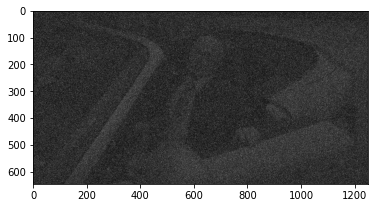

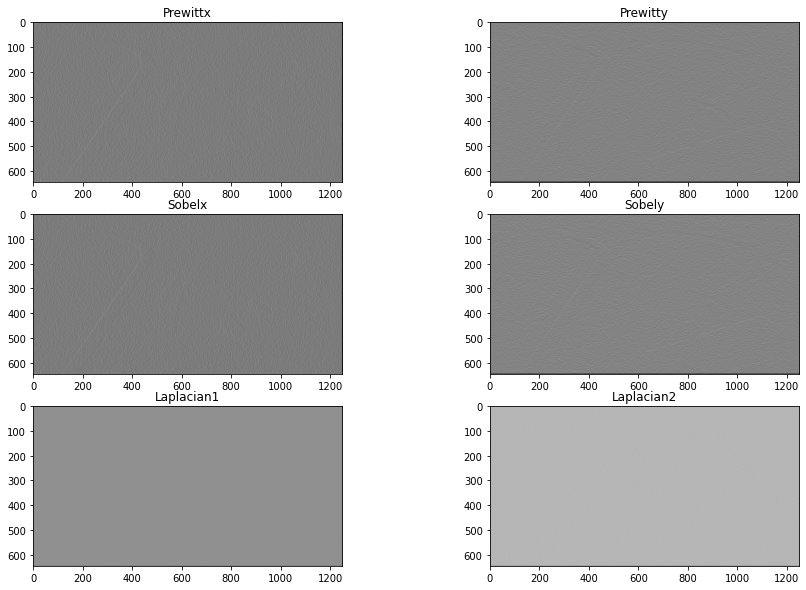

In [469]:
im = cv2.imread("../imgs/Creed.png")

im = im[:,:,0]*(1/3) + im[:,:,1]*(1/3) + im[:,:,2]*(1/3)
h,w = im.shape
im = im.astype('i')
res = np.empty((h,w),dtype = int)
out1 = np.empty((h,w),dtype = int)
out2 = np.empty((h,w),dtype = int)
out3 = np.empty((h,w),dtype = int)
out4 = np.empty((h,w),dtype = int)
out5 = np.empty((h,w),dtype = int)
out6 = np.empty((h,w),dtype = int)

noise = np.random.normal(0,0.2,im.shape)
noise = np.abs(noise)
noise = (noise*255)
res = noise + im
res = res.astype('i')

plt.imshow(res,cmap = 'gray')
fig = plt.figure(figsize = (15,10))
fig.add_subplot(3,2,1)
out1 = edgedetection(res,'Prewittx5',5)
plt.imshow(out1,cmap = 'gray')
plt.title('Prewittx')
fig.add_subplot(3,2,2)
out2 = edgedetection(res,'Prewitty5',5)
plt.imshow(out2,cmap = 'gray')
plt.title('Prewitty')

fig.add_subplot(3,2,3)
out3 = edgedetection(res,'Sobelx5',5)
plt.imshow(out3,cmap = 'gray')
plt.title('Sobelx')
fig.add_subplot(3,2,4)
out4 = edgedetection(res,'Sobely5',5)
plt.imshow(out4,cmap = 'gray')
plt.title('Sobely')

fig.add_subplot(3,2,5)
out5 = edgedetection(res,'Laplacian1',3)
plt.imshow(out5,cmap = 'gray')
plt.title('Laplacian1')
fig.add_subplot(3,2,6)
out6 = edgedetection(res,'Laplacian2',3)
plt.imshow(out6,cmap = 'gray')
plt.title('Laplacian2')
plt.show()

Among these filters, it is observed Sobel and Prewitt filters performed better compared to Laplacian

QUESTION - 8

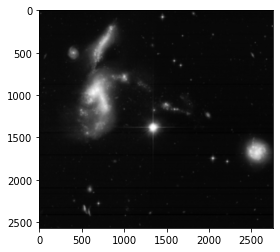

In [517]:
im = cv2.imread("../imgs/galaxies.jpeg")
im = im[:,:,0]*(1/3) + im[:,:,1]*(1/3) + im[:,:,2]*(1/3)
im = im.astype('i')
h,w = im.shape

a1 = [0,0.8]
b1= [0.8,1]
k11 = [0,0]
k22 = [0,1]
#plt.imshow(im,cmap = 'gray')
out1 = np.empty((h,w),dtype = int)



out1 = piecewiseLinTransform(out1,k11,k22,a1,b1)
out1 = effMeanFilter(im,7)
out1 = effMeanFilter(im,15)
#out1 = effMeanFilter(out1,3)
plt.imshow(out1,cmap = 'gray')